## Example plotting following [ASP Docs jitter_solve ASTER example](https://stereopipeline.readthedocs.io/en/latest/tools/jitter_solve.html#aster-cameras) for ASTER with Jitter Correction

Below are example `asp_plot` outputs following the processing in the [ASP Docs jitter_solve ASTER example](https://stereopipeline.readthedocs.io/en/latest/tools/jitter_solve.html#aster-cameras).

**Before exploring this example, be sure you can produce mapprojected outputs and DEMs [with this notebook](aster_with_mapprojection.ipynb).**

We diverge from the documentation example data, instead retrieving the example data used in https://github.com/uw-cryo/asp_tutorials:

> **Note on ASTER L1A data format change:** In December 2025, NASA decommissioned the ASTER L1A Version 003 product (distributed as a `.zip` of GeoTIFF images and text geometry files) and replaced it with Version 004 (distributed as a single HDF-EOS2 `.hdf` file). The Zenodo archive below preserves the old V003 format. If you are downloading new ASTER data from NASA Earthdata, you will receive V004 HDF files instead. Both formats are supported by `aster2asp` (HDF support requires ASP build 2026-01-28 or later). See the [aster2asp documentation](https://stereopipeline.readthedocs.io/en/latest/tools/aster2asp.html#aster2asp) for details.

**Option A: V003 data from Zenodo (legacy format)**
```bash
wget https://zenodo.org/record/7972223/files/AST_L1A_00307312017190728_20200218153629_19952.zip

mkdir dataDir

tar xvf AST_L1A_00307312017190728_20200218153629_19952.zip -C dataDir
```

**Option B: V004 data from NASA Earthdata (current format)**

Download an ASTER L1A `.hdf` file from [NASA Earthdata](https://search.earthdata.nasa.gov/).

---

Pre-process the images for stereo:

```bash
# For V003 directory input:
aster2asp dataDir -o out

# For V004 HDF input:
aster2asp input.hdf -o out
```

Both produce the same output:

```
out-Band3B.tif
out-Band3B.xml
out-Band3N.tif
out-Band3N.xml
```

---

We download Copernicus 30 m reference DEM data, using: https://github.com/uw-cryo/fetch_dem:

- You will need to [request your own OpenTopography API key](https://portal.opentopography.org/requestService?service=api) to add to this command as the argument to `-apikey`.
- You will also need the output of mapprojection [from the previous notebook](aster_with_mapprojection.ipynb) to use `out-Band3B_proj.tif` as the extent argument to `-raster_fn`.

Once you have that prepared:

```bash
python download_global_DEM.py \
  -demtype COP30 \
  -raster_fn out-Band3B_proj.tif \
  -out_fn cop30.tif \
  -apikey [OPEN_TOPOGRAPHY_API_KEY]
```

Then adjust the vertical reference to attain a reference DEM relative to the WGS84 ellipsoid:

```bash
dem_geoid --geoid egm2008 --reverse-adjustment cop30.tif

mv cop30-adj.tif ref.tif
```

And then blur the reference dem per the docs with:

```bash
dem_mosaic --dem-blur-sigma 2 ref.tif -o ref_blur.tif
```

---

Run initial bundle adjustment:

```bash
bundle_adjust -t aster          \
  --aster-use-csm               \
  --camera-weight 0.0           \
  --tri-weight 0.1              \
  --tri-robust-threshold 0.1    \
  --num-iterations 50           \
  out-Band3N.tif out-Band3B.tif \
  out-Band3N.xml out-Band3B.xml \
  -o ba/run
```

---

Run mapprojection:

**Note:** The ASTER scene is from Mt. Rainier in Washington State, so the local stereographic projection uses (-121.7603, 46.8523) as the (lon, lat):

```bash
proj='+proj=stere +lat_0=46.8523 +lon_0=-121.7603 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs'

mapproject -t csm                       \
 --tr 15 --t_srs "$proj"                \
  ref_blur.tif out-Band3N.tif           \
  ba/run-out-Band3N.adjusted_state.json \
  out-Band3N.map.tif

mapproject -t csm                       \
 --tr 15 --t_srs "$proj"                \
  ref_blur.tif out-Band3B.tif           \
  ba/run-out-Band3B.adjusted_state.json \
  out-Band3B.map.tif
```

---

Run stereo processing and DEM generation:

```bash
parallel_stereo                         \
  --stereo-algorithm asp_bm             \
  --subpixel-mode 1                     \
  --max-disp-spread 100                 \
  --num-matches-from-disparity 100000   \
  out-Band3N.map.tif out-Band3B.map.tif \
  ba/run-out-Band3N.adjusted_state.json \
  ba/run-out-Band3B.adjusted_state.json \
  stereo_bm/run                         \
  ref_blur.tif

point2dem --errorimage --t_srs "$proj" \
  --tr 15 stereo_bm/run-PC.tif         \
  --orthoimage stereo_bm/run-L.tif
```


The results of this first part are displayed below.

## Result of stereo before correction for jitter

Example plots showing the outputs prior to jitter correction.

In [1]:
directory = "/Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/"
bundle_adjust_directory = "ba/"
stereo_directory = "stereo_bm/"
reference_dem = f"{directory}ref.tif"

### Processing Parameters

In [2]:
%load_ext autoreload
%autoreload 2

from asp_plot.processing_parameters import ProcessingParameters

In [3]:
processing_parameters = ProcessingParameters(
    processing_directory=directory,
    bundle_adjust_directory=bundle_adjust_directory,
    stereo_directory=stereo_directory
)
processing_parameters_dict = processing_parameters.from_log_files()

print(f"Processed on: {processing_parameters_dict['processing_timestamp']}\n")

print(f"Reference DEM: {processing_parameters_dict['reference_dem']}\n")

print(f"Bundle adjustment ({processing_parameters_dict['bundle_adjust_run_time']}):\n")
print(processing_parameters_dict["bundle_adjust"])

print(f"\nStereo ({processing_parameters_dict['stereo_run_time']}):\n")
print(processing_parameters_dict["stereo"])

print(f"\nPoint2dem ({processing_parameters_dict['point2dem_run_time']}):\n")
print(processing_parameters_dict["point2dem"])

Processed on: 2025-11-17 15:41:15

Reference DEM: ref_blur.tif

Bundle adjustment (0 hours and 0 minutes):

bundle_adjust -t aster --aster-use-csm --camera-weight 0.0 --tri-weight 0.1 --tri-robust-threshold 0.1 --num-iterations 50 out-Band3N.tif out-Band3B.tif out-Band3N.xml out-Band3B.xml -o ba/run

Stereo (0 hours and 3 minutes):

stereo --stereo-algorithm asp_bm --subpixel-mode 1 --max-disp-spread 100 --num-matches-from-disparity 100000 out-Band3N.map.tif out-Band3B.map.tif ba/run-out-Band3N.adjusted_state.json ba/run-out-Band3B.adjusted_state.json stereo_bm/run ref_blur.tif --corr-seed-mode 1 --sgm-collar-size 0 --compute-point-cloud-center-only --threads 8

Point2dem (0 hours and 0 minutes):

point2dem --t_srs "+proj=stere +lat_0=46.8523 +lon_0=-121.7603 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs" --tr 15 stereo_bm/run-align-trans_reference.tif


### Scene Plots

In [4]:
from asp_plot.scenes import ScenePlotter

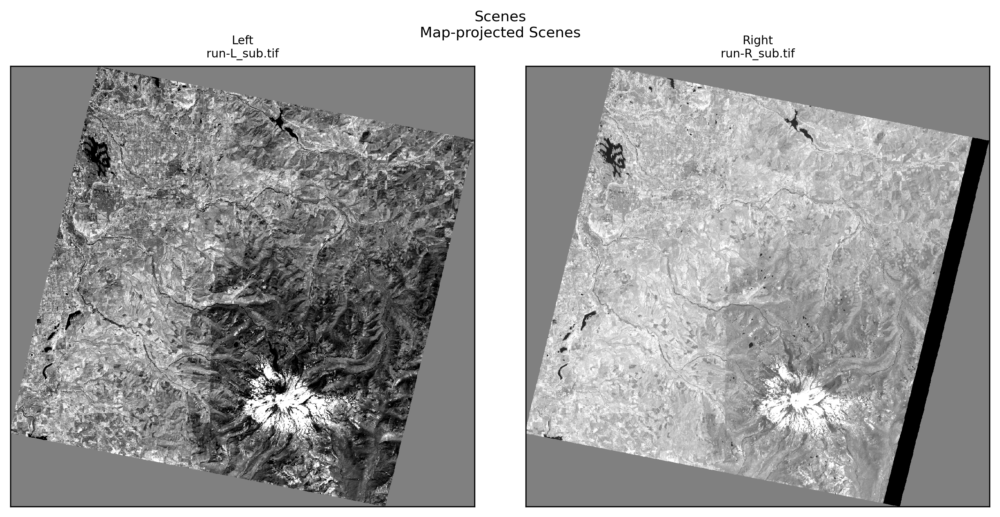

In [5]:
plotter = ScenePlotter(
  directory,
  stereo_directory,
  title="Scenes"
)

plotter.plot_scenes()

### Bundle Adjustment Plots

In [6]:
import contextily as ctx
from asp_plot.bundle_adjust import ReadBundleAdjustFiles, PlotBundleAdjustFiles

In [7]:
map_crs = "EPSG:4326"

ctx_kwargs = {
    "crs": map_crs,
    "source": ctx.providers.Esri.WorldImagery,
    "attribution_size": 0,
    "alpha": 0.5,
}

In [8]:
ba_files = ReadBundleAdjustFiles(directory, bundle_adjust_directory)
resid_initial_gdf, resid_final_gdf = ba_files.get_initial_final_residuals_gdfs(residuals_in_meters=True)


Could not read stereopair metadata to get mean GSD. Residuals will remain in pixels.





Could not read stereopair metadata to get mean GSD. Residuals will remain in pixels.





More than two XML files found in directory. Mosaicking before proceeding.


More than two XML files found in directory. Mosaicking before proceeding.



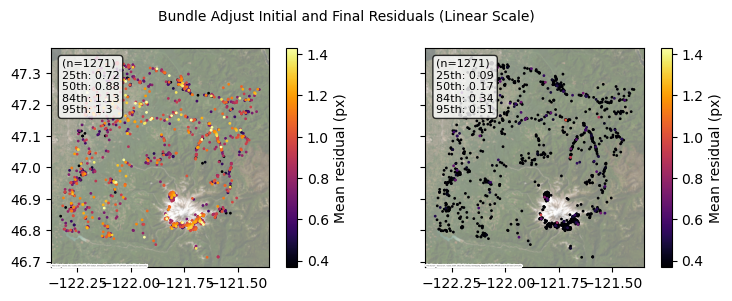

In [9]:
plotter = PlotBundleAdjustFiles(
  [resid_initial_gdf, resid_final_gdf],
  lognorm=False,
  title="Bundle Adjust Initial and Final Residuals (Linear Scale)"
)

plotter.plot_n_gdfs(
    column_name="mean_residual",
    cbar_label="Mean residual (px)",
    map_crs=map_crs,
    **ctx_kwargs
)

### Stereo Plots

In [10]:
from asp_plot.stereo import StereoPlotter

In [11]:
plotter = StereoPlotter(
  directory, 
  stereo_directory,
  reference_dem=reference_dem,
)


Reference DEM: /Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/ref.tif


ASP DEM: /Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/stereo_bm/run-DEM.tif



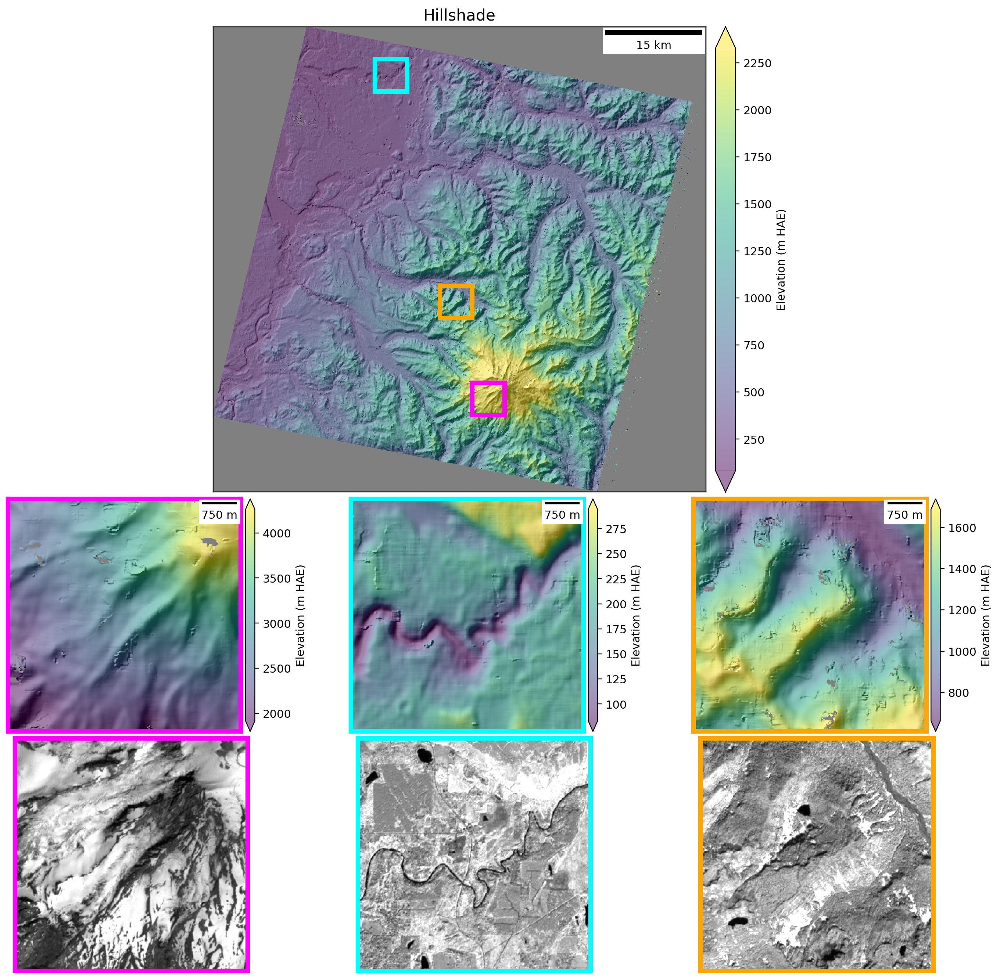

In [12]:
plotter.title = "Hillshade"

plotter.plot_detailed_hillshade(
  subset_km=5
)

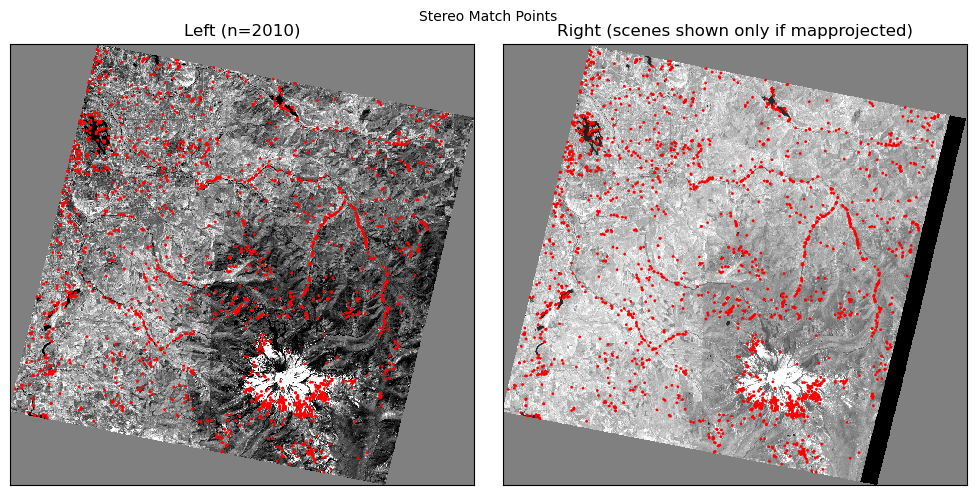

In [13]:
plotter.title="Stereo Match Points"

plotter.plot_match_points()

Plotting DEM results. This can take a minute for large inputs.



Found a DEM of difference: /Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/stereo_bm/run-diff.tif.
Using that for difference map plotting.




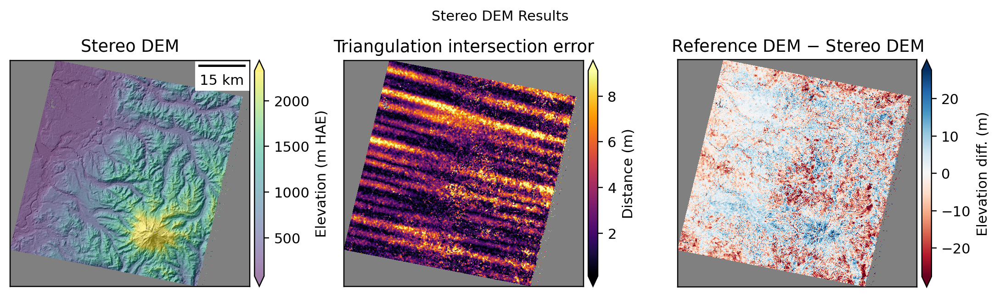

In [14]:
plotter.title = "Stereo DEM Results"

plotter.plot_dem_results()

## Jitter Correction

Following the initial stereo results, we continue with the ASP docs example commands:

---

Align the initial DEM to the COP30 reference and create the aligned DEM:

```bash
pc_align --max-displacement 50          \
  stereo_bm/run-DEM.tif ref.tif           \
  -o stereo_bm/run-align                  \
  --save-inv-transformed-reference-points

point2dem --t_srs "$proj" --tr 15 \
  stereo_bm/run-align-trans_reference.tif
```

Then take the difference:

```bash
geodiff stereo_bm/run-align-trans_reference-DEM.tif \
  ref.tif -o stereo_bm/run
```

---

Apply another bundle adjustment step:

```bash
bundle_adjust -t csm                        \
  --initial-transform                       \
  stereo_bm/run-align-inverse-transform.txt \
  --apply-initial-transform-only            \
  out-Band3N.map.tif out-Band3B.map.tif     \
  ba/run-out-Band3N.adjusted_state.json     \
  ba/run-out-Band3B.adjusted_state.json     \
  -o ba_align/run
```

---

Solve for jitter:

```bash
mkdir -p jitter

cp stereo_bm/run-disp-out-Band3N__out-Band3B.match \
  jitter/run-out-Band3N__out-Band3B.match

jitter_solve out-Band3N.tif out-Band3B.tif        \
  ba_align/run-run-out-Band3N.adjusted_state.json \
  ba_align/run-run-out-Band3B.adjusted_state.json \
  --max-pairwise-matches 100000                   \
  --num-lines-per-position 100                    \
  --num-lines-per-orientation 100                 \
  --max-initial-reprojection-error 20             \
  --num-iterations 50                             \
  --match-files-prefix jitter/run                 \
  --heights-from-dem ref.tif                      \
  --heights-from-dem-uncertainty 20               \
  --num-anchor-points 0                           \
  --anchor-weight 0.0                             \
  -o jitter/run
```

---

Re-run mapprojection, stereo, and point2dem using the new jitter solve cameras:

```bash
proj='+proj=stere +lat_0=46.8523 +lon_0=-121.7603 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs'

mapproject -t csm                       \
 --tr 15 --t_srs "$proj"                \
  ref_blur.tif out-Band3N.tif           \
  jitter/run-run-run-out-Band3N.adjusted_state.json \
  out-Band3N.map.jitter-solved.tif

mapproject -t csm                       \
 --tr 15 --t_srs "$proj"                \
  ref_blur.tif out-Band3B.tif           \
  jitter/run-run-run-out-Band3B.adjusted_state.json \
  out-Band3B.map.jitter-solved.tif

parallel_stereo                         \
  --stereo-algorithm asp_mgm            \
  --subpixel-mode 9                     \
  --max-disp-spread 100                 \
  --num-matches-from-disparity 100000   \
  out-Band3N.map.jitter-solved.tif out-Band3B.map.jitter-solved.tif \
  jitter/run-run-run-out-Band3N.adjusted_state.json \
  jitter/run-run-run-out-Band3B.adjusted_state.json \
  stereo_mgm_jitter_solved/run                         \
  ref_blur.tif

point2dem --errorimage --t_srs "$proj" \
  --tr 15 stereo_mgm_jitter_solved/run-PC.tif

gdalwarp -s_srs "$proj" \
         -t_srs EPSG:32610 \
         -tr 30 30 \
         stereo_mgm_jitter_solved/run-DEM.tif stereo_mgm_jitter_solved/run-DEM_30m.tif
```


The results of this jitter solved output are displayed below.


### Stereo Results

In [15]:
directory = "/Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/"
stereo_directory = "stereo_mgm_jitter_solved/"
reference_dem = f"{directory}ref.tif"


Reference DEM: /Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/ref.tif


ASP DEM: /Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/stereo_mgm_jitter_solved/run-DEM_30m.tif

Plotting DEM results. This can take a minute for large inputs.



Found a DEM of difference: /Users/ben/Dropbox/UW_Shean/asp_plot-test_data/docs_examples/docs_sect_6_39_11_aster_jitter/stereo_mgm_jitter_solved/run-DEM_30m_ref_diff.tif.
Using that for difference map plotting.




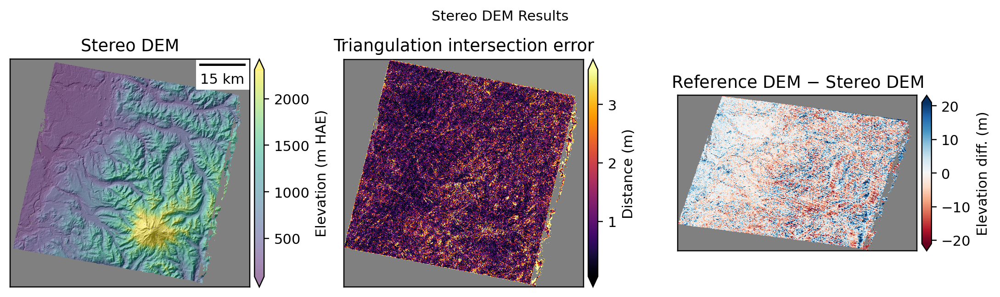

In [16]:
plotter = StereoPlotter(
  directory, 
  stereo_directory,
  reference_dem=reference_dem,
  dem_gsd=30,
)

plotter.title = "Stereo DEM Results"

plotter.plot_dem_results()

### ICESat-2 Altimetry Validation

In [17]:
import contextily as ctx
from datetime import datetime
from asp_plot.altimetry import Altimetry

In [18]:
map_crs = "EPSG:32610"

ctx_kwargs = {
    "crs": map_crs,
    "source": ctx.providers.Esri.WorldImagery,
    "attribution_size": 0,
    "alpha": 0.5,
}

In [19]:
icesat = Altimetry(
  directory=directory,
  dem_fn=plotter.dem_fn
)

In [20]:
icesat.request_atl06sr_multi_processing(
    processing_levels=["all", "ground"],
    save_to_parquet=True,
)


ICESat-2 ATL06 request processing for: all
{'poly': [{'lon': -122.36648676044332, 'lat': 46.68467686575204}, {'lon': -122.36648676044332, 'lat': 47.363787417455434}, {'lon': -121.32622773402014, 'lat': 47.363787417455434}, {'lon': -121.32622773402014, 'lat': 46.68467686575204}, {'lon': -122.36648676044332, 'lat': 46.68467686575204}], 'res': 20, 'len': 40, 'ats': 20, 'maxi': 6, 'samples': {'esa_worldcover': {'asset': 'esa-worldcover-10meter'}}, 'cnf': 'atl03_high', 'srt': -1, 'cnt': 10}
Existing file found, reading in: atl06sr_all.parquet


Parameters don't match request. Regenerating...


Filtering ATL06-SR all



ICESat-2 ATL06 request processing for: ground
{'poly': [{'lon': -122.36648676044332, 'lat': 46.68467686575204}, {'lon': -122.36648676044332, 'lat': 47.363787417455434}, {'lon': -121.32622773402014, 'lat': 47.363787417455434}, {'lon': -121.32622773402014, 'lat': 46.68467686575204}, {'lon': -122.36648676044332, 'lat': 46.68467686575204}], 'res': 20, 'len': 40, 'ats': 20, 'maxi': 6, 'samples': {'esa_worldcover': {'asset': 'esa-worldcover-10meter'}}, 'cnf': 'atl03_low', 'srt': -1, 'cnt': 5, 'atl08_class': 'atl08_ground'}
Existing file found, reading in: atl06sr_ground.parquet


Parameters don't match request. Regenerating...


Filtering ATL06-SR ground


In [21]:
icesat.filter_esa_worldcover(filter_out="water")

In [22]:
icesat_filter_date = "2017-07-31"

icesat_filter_date = datetime.strptime(icesat_filter_date, "%Y-%m-%d").date()

icesat.predefined_temporal_filter_atl06sr(date=icesat_filter_date)


Filtering ATL06 with 15 day pad, 45 day, 91 day pad, and seasonal pad around 2017-07-31 00:00:00 for: all



Filtering ATL06 with 15 day pad, 45 day, 91 day pad, and seasonal pad around 2017-07-31 00:00:00 for: ground



icesat_minus_dem not found in ATL06 dataframe: all. Running differencing first.



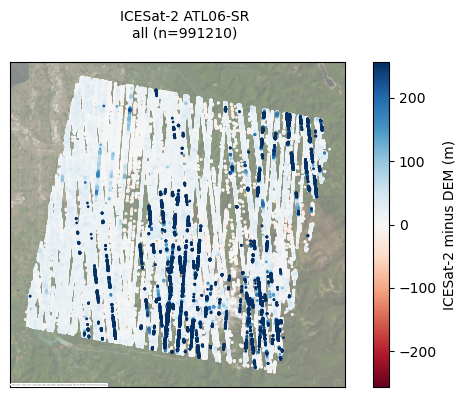

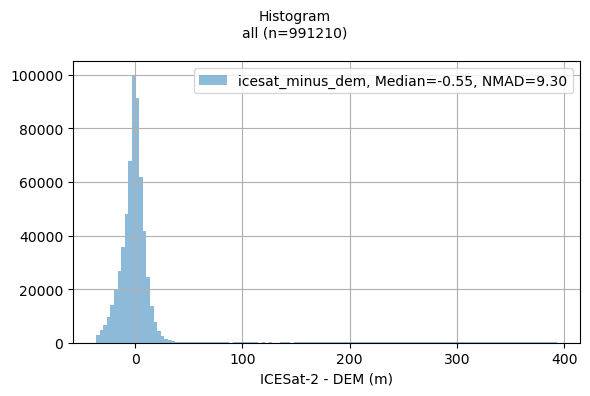

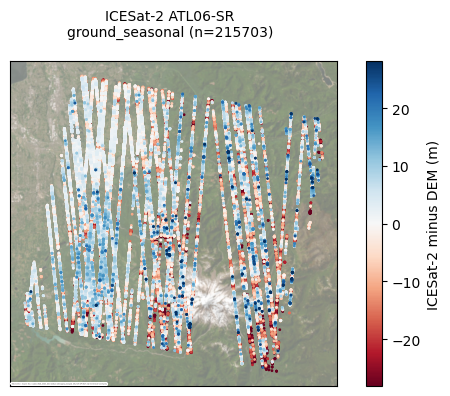

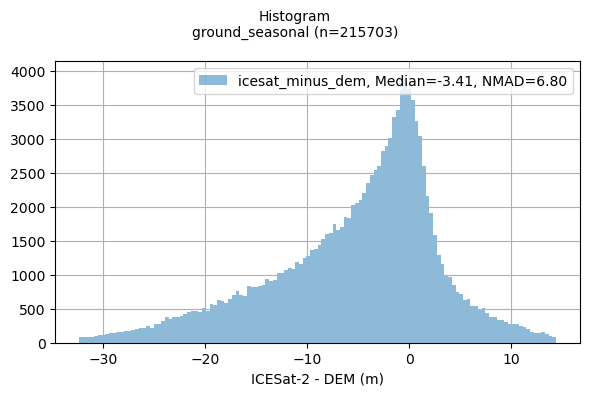

In [23]:
icesat.mapview_plot_atl06sr_to_dem(
    key="all",
    map_crs=map_crs,
    **ctx_kwargs,
)

icesat.histogram(
    key="all",
    plot_aligned=False,
)

icesat.mapview_plot_atl06sr_to_dem(
    key="ground_seasonal",
    map_crs=map_crs,
    **ctx_kwargs,
)

icesat.histogram(
    key="ground_seasonal",
    plot_aligned=False,
)

### Compare with NO Jitter Solving

For reference, here is the seasonal ICESat histogram result for the same area with mapprojection but no jitter solving step. **Note the reduction in NMAD with jitter solving applied**:

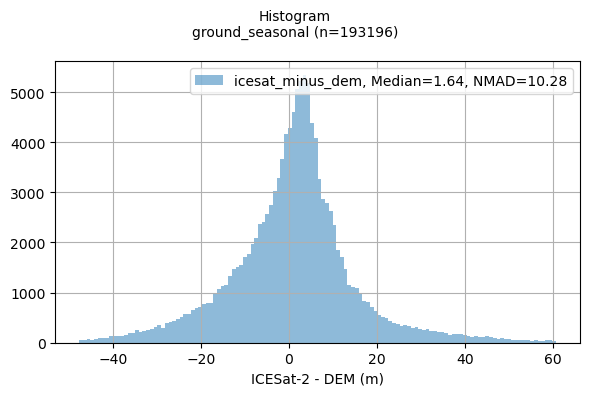